# Excited State from TD-DFT

Simple Juypter notebook that performs TD-DFT (Time-dependent density-functional theory) using pyscf.

Part of the code take from and inspired by https://www.andersle.no/posts/2022/mo/mo.html

## Setup python environment and imports

In [1]:
%%capture
!pip install numpy
!pip install scipy
!pip install Cython
!pip install pandas
!pip install sklearn
!pip install statsmodels
!pip install matplotlib
!pip install rdkit
!pip install py3Dmol
!pip install ipywidgets
!pip install sphinx
!pip install nbsphinx
!pip install pydata-sphinx-theme
!pip install lxml
!pip install fortecubeview
!pip install pythreejs
!pip install scikit-image
!pip install pyscf
!pip install shap
!pip install catboost
!pip install graphviz

In [2]:
import pathlib

# RDKit imports:
from rdkit import Chem
from rdkit.Chem import (
    AllChem,
    rdCoordGen,
)
from rdkit.Chem.Draw import IPythonConsole

IPythonConsole.ipython_useSVG = True  # Use higher quality images for molecules

# For visualization of molecules and orbitals:
import py3Dmol
import fortecubeview

# pyscf imports:
from pyscf import gto, scf, dft, tddft, tools

from pyscf.data.nist import HARTREE2EV
from pyscf.data.nist import HARTREE2WAVENUMBER

# For plotting
import matplotlib
from matplotlib import pyplot as plt

%matplotlib inline

# For numerics:
import numpy as np

from google.colab import output
output.enable_custom_widget_manager()

## Function Definitions

In [3]:
def get_xyz(molecule, optimize=False):
    """Get xyz-coordinates for the molecule"""
    mol = Chem.Mol(molecule)
    mol = AllChem.AddHs(mol, addCoords=True)
    AllChem.EmbedMolecule(mol)
    if optimize:  # Optimize the molecules with the MM force field:
        AllChem.MMFFOptimizeMolecule(mol)
    xyz = []
    for lines in Chem.MolToXYZBlock(mol).split("\n")[2:]:
        strip = lines.strip()
        if strip:
            xyz.append(strip)
    xyz = "\n".join(xyz)
    return mol, xyz

In [4]:
def run_calculation_tddft(xyz, functional="b3lyp", basis="sto-3g", nstates=5,symmetry=False):
    """Calculate the energy (+ additional things like MO coefficients) with pyscf."""
    mol = gto.M(
        atom=xyz,
        basis=basis,
        unit="ANG",
        symmetry=symmetry,
    )
    mol.build()
    mf = dft.RKS(mol)
    mf.xc = functional
    mf.kernel()
    td = tddft.TDDFT(mf)
    td.nstates = nstates
    td.kernel()
    return mf, mol, td

In [5]:
def write_cube_files(
    max_homo_lumo=5, prefix="", dirname=".", margin=5, write_all_orbitals=False
):
    """Write cube files for the given coefficients."""
    path = pathlib.Path(dirname)
    path.mkdir(parents=True, exist_ok=True)

    # find index of HOMO and LUMO
    lumo = float("inf")
    lumo_idx = None
    homo = -float("inf")
    homo_idx = None
    for i, (energy, occ) in enumerate(zip(mf.mo_energy, mf.mo_occ)):
        if occ > 0 and energy > homo:
            homo = energy
            homo_idx = i
        if occ == 0 and energy < lumo:
            lumo = energy
            lumo_idx = i

    if(write_all_orbitals):
      for i in range(mf.mo_coeff.shape[1]):
        outfile = f"{prefix}Orbital-{i:02d}.cube"
        outfile = path / outfile
        print(f"Writing {outfile}")
        tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, i], margin=margin)
    else:
      print(f"HOMO (index): {homo_idx+1}")
      print(f"LUMO (index): {lumo_idx+1}")
      print("")
      outfile = f"{prefix}HOMO.cube"
      outfile = path / outfile
      print(f"Writing {outfile}")
      tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, homo_idx], margin=margin)

      outfile = f"{prefix}LUMO.cube"
      outfile = path / outfile
      print(f"Writing {outfile}")
      tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, lumo_idx], margin=margin)

      for i in range(1,max_homo_lumo+1):
        outfile = f"{prefix}HOMO_minus-{i:02d}.cube"
        outfile = path / outfile
        print(f"Writing {outfile}")
        tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, homo_idx-i], margin=margin)

        outfile = f"{prefix}LUMO_plus-{i:02d}.cube"
        outfile = path / outfile
        print(f"Writing {outfile}")
        tools.cubegen.orbital(mol, outfile, mf.mo_coeff[:, lumo_idx+i], margin=margin)

In [6]:
def GaussianPeak(x,mean,sigma):
  return np.exp(-(x-mean)**2/(2*sigma**2))

def plot_spectrum_eV(exc,osc,width=0.2,x_range=None):
  if x_range is None:
    x_min = round(exc[0]-4*width)
    x_max = round(exc[-1]+4*width+0.5)
  else:
    x_min = x_range[0]
    x_max = x_range[1]
  x=np.linspace(x_min,x_max,1000)
  y=np.zeros(x.size)
  for i, e in enumerate(exc):
    if not np.isnan(osc[i]):
      y+=osc[i]*GaussianPeak(x,e,width)

  plt.plot(x,y)
  plt.xlabel("Excitation [eV]")
  plt.ylabel("Intensity")
  plt.xlim([x_min,x_max])
  for i, e in enumerate(exc):
    if not np.isnan(osc[i]):
      plt.stem(e,osc[i],linefmt="--")
  plt.show()

def plot_spectrum_nm(exc,osc,width=10,x_range=None):
  if x_range is None:
    x_min = round(exc[-1]-4*width+0.5)
    x_max = round(exc[0]+4*width)
  else:
    x_min = x_range[0]
    x_max = x_range[1]
  x=np.linspace(x_min,x_max,1000)
  y=np.zeros(x.size)
  for i, e in enumerate(exc):
    if not np.isnan(osc[i]):
      y+=osc[i]*GaussianPeak(x,e,width)

  plt.plot(x,y)
  plt.xlabel("Wavelength [nm]")
  plt.ylabel("Intensity")
  plt.xlim([x_min,x_max])
  for i, e in enumerate(exc):
    if not np.isnan(osc[i]):
      plt.stem(e,osc[i],linefmt="--")
  plt.show()


## Definition of Molecule from SMILES String

**Here you should define the smiles string for the molecule you want to consider**




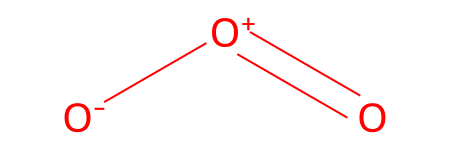

In [21]:
molecule_smiles = "[O-][O+]=O" #@param {type:"string"}

molecule_name = "Mol"
molecule = Chem.MolFromSmiles(molecule_smiles)  # Generate the molecule from smiles
molecule

## Setup of Molecule

In [22]:
molecule3d, xyz = get_xyz(molecule, optimize=True)
print(xyz)

O      1.154720   -0.200431    0.000000
O     -0.049588    0.429144   -0.000000
O     -1.105132   -0.228713   -0.000000


In [23]:
view = py3Dmol.view(
    data=Chem.MolToMolBlock(molecule3d),
    style={"stick": {}, "sphere": {"scale": 0.3}},
    width=300,
    height=300,
  )
view.zoomTo()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

## DFT and TD-DFT Calculations

In [24]:
mf, mol, td = run_calculation_tddft(xyz, basis="cc-pVDZ",nstates=10,symmetry=True)

converged SCF energy = -225.419179115496
Excited State energies (eV)
[ 1.68709768  2.08132057  4.83622006  7.26322527  7.99562327  8.39842815
  8.89820732  8.99716038 10.32292415 11.88201835]


## Analysis of Results

### DFT Results



In [25]:
mf.analyze(verbose=3)

Wave-function symmetry = A'
occupancy for each irrep:     A'   A"
                              10    2
**** MO energy ****
MO #1 (A' #1), energy= -19.4239538106108 occ= 2
MO #2 (A' #2), energy= -19.2728312263407 occ= 2
MO #3 (A' #3), energy= -19.2466528734167 occ= 2
MO #4 (A' #4), energy= -1.34532088657452 occ= 2
MO #5 (A' #5), energy= -1.0721691003423 occ= 2
MO #6 (A' #6), energy= -0.787333636823186 occ= 2
MO #7 (A' #7), energy= -0.585380671740128 occ= 2
MO #8 (A" #1), energy= -0.584210368820201 occ= 2
MO #9 (A' #8), energy= -0.578207673678198 occ= 2
MO #10 (A" #2), energy= -0.355701147228044 occ= 2
MO #11 (A' #9), energy= -0.345992586372173 occ= 2
MO #12 (A' #10), energy= -0.329231492251034 occ= 2
MO #13 (A" #3), energy= -0.192670214676755 occ= 0
MO #14 (A' #11), energy= 0.0180343300995972 occ= 0
MO #15 (A' #12), energy= 0.164298421295081 occ= 0
MO #16 (A' #13), energy= 0.764732615818429 occ= 0
MO #17 (A" #4), energy= 0.782193658104919 occ= 0
MO #18 (A' #14), energy= 0.8014470673191

((array([1.99996361e+00, 1.89979628e+00, 4.79292114e-03, 1.14036750e+00,
         1.78177062e+00, 1.34914634e+00, 5.66846487e-03, 2.39368412e-03,
         7.42497843e-04, 1.78815204e-03, 2.51836498e-04, 7.78004095e-04,
         9.75513882e-04, 1.75330591e-03, 1.99995908e+00, 1.68471941e+00,
         7.29796770e-03, 1.07879940e+00, 1.53586897e+00, 1.34348444e+00,
         1.69582765e-02, 4.74145514e-03, 2.57000543e-03, 5.76683258e-03,
         1.42125844e-03, 1.93236957e-03, 2.47459182e-03, 3.36641113e-03,
         1.99996048e+00, 1.83582457e+00, 7.73552951e-03, 1.24581871e+00,
         1.71269251e+00, 1.29525863e+00, 8.42969336e-03, 4.28629514e-03,
         1.56691251e-03, 3.15655251e-03, 5.71203731e-04, 1.20950158e-03,
         1.53677178e-03, 2.40343362e-03]),
  array([-0.19018873,  0.31063953, -0.1204508 ])),
 array([-0.39126517,  0.51942085,  0.        ]))

### TD-DFT Results

In [26]:
td.analyze(verbose=4)


** Singlet excitation energies and oscillator strengths **
Excited State   1:   A"      1.68710 eV    734.90 nm  f=0.0000
      12 -> 13       -0.71010
Excited State   2:   A"      2.08132 eV    595.70 nm  f=0.0000
      11 -> 13       -0.70738
Excited State   3:   A'      4.83622 eV    256.37 nm  f=0.0673
      10 -> 13        0.67925
      11 -> 14        0.21828
Excited State   4:   A'      7.26323 eV    170.70 nm  f=0.0006
      11 -> 14        0.25380
      12 -> 14       -0.65675
Excited State   5:   A"      7.99562 eV    155.07 nm  f=0.0000
      10 -> 14       -0.70436
Excited State   6:   A"      8.39843 eV    147.63 nm  f=0.0006
       9 -> 13       -0.70418
Excited State   7:   A"      8.89821 eV    139.34 nm  f=0.0000
       7 -> 13       -0.70532
Excited State   8:   A'      8.99716 eV    137.80 nm  f=0.1072
       7 -> 14       -0.10229
      10 -> 13        0.20748
      11 -> 14       -0.58467
      12 -> 14       -0.22038
      12 -> 15        0.24755
Excited State   

## Plot Spectrum

Here we plot the spectra by taking each excitation as a Gaussian peak with a finite width that represent broading effects. Each Gaussian peak is weighted with the oscillator strength.

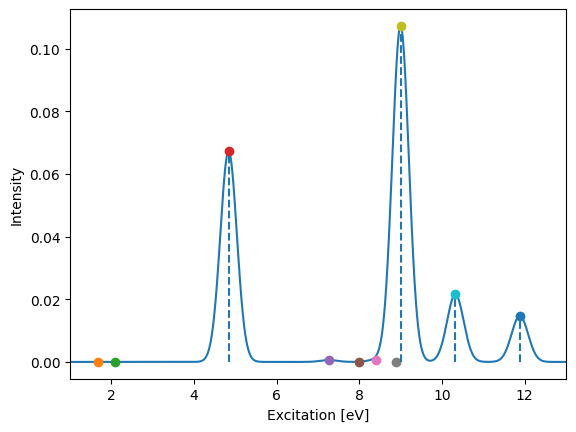

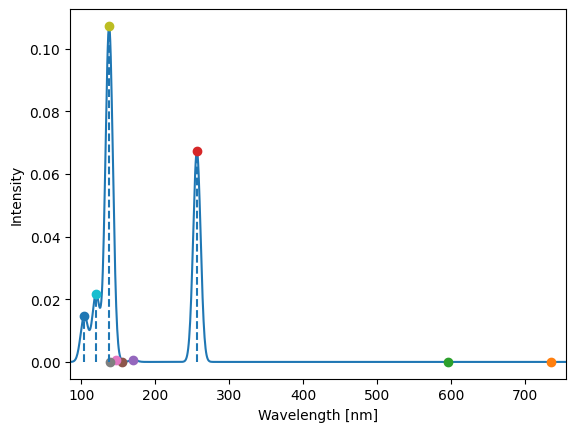

In [28]:
exc_eV=td.e*HARTREE2EV
osc=td.oscillator_strength()
exc_nm=1e7/(td.e*HARTREE2WAVENUMBER)

# print(exc_eV)
# print(exc_nm)

# Peak width in eV
peak_width_eV=0.2
peak_width_nm=5

plot_spectrum_eV(exc_eV,osc,width=peak_width_eV)
plot_spectrum_nm(exc_nm,osc,width=peak_width_nm)


## Setup Orbitals

In [30]:
!rm -rf cube_files
write_cube_files(
   dirname="cube_files",
   write_all_orbitals=False,
   max_homo_lumo=5
)

HOMO (index): 12
LUMO (index): 13

Writing cube_files/HOMO.cube
Writing cube_files/LUMO.cube
Writing cube_files/HOMO_minus-01.cube
Writing cube_files/LUMO_plus-01.cube
Writing cube_files/HOMO_minus-02.cube
Writing cube_files/LUMO_plus-02.cube
Writing cube_files/HOMO_minus-03.cube
Writing cube_files/LUMO_plus-03.cube
Writing cube_files/HOMO_minus-04.cube
Writing cube_files/LUMO_plus-04.cube
Writing cube_files/HOMO_minus-05.cube
Writing cube_files/LUMO_plus-05.cube


## Visualize Orbitals

In [31]:
fortecubeview.plot(path="./cube_files/", width=600, height=300, colorscheme='national', sumlevel=0.7)

CubeViewer: listing cube files from the directory ./cube_files/
Reading 12 cube files


HTML(value='\n        <style>\n           .jupyter-widgets-output-area .output_scroll {\n                heigh…

interactive(children=(Select(description='Cube files:', options=('./cube_files/HOMO.cube', './cube_files/HOMO_…

TraitError: The 'target' trait of a DirectionalLight instance expected an Uninitialized or an Object3D, not the str 'IPY_MODEL_e76ceea8-f3b9-468e-a041-915610bf939c'.